# Bigskyearth - vaex - part 2


Create a new environment:
```
conda create -n bse python=3 vaex ipyvolume ipyleaflet bqplot
```

Or install in the current
```
conda install vaex ipyvolume ipyleaflet bqplot
```

* Future - using widgets
* Ipywidgets
* Intro
* Use with matplotlib
* Other libraries
* Bqplot
* Pythreejs
* Ipyleaflet
* Ipyvolume


## Ipywidgets
 * [Documentation](ipywidgets.readthedocs.io)
 * [Github](https://github.com/jupyter-widgets/ipywidgets)

In [1]:
import IPython

In [2]:
IPython.display.Image(url="https://apod.nasa.gov/apod/image/1703/OrionTrapezium_Hubble_960.jpg")

In [3]:
%%html
<button>click</button>

In [4]:
%%html
<button onclick='alert("hi")'>click</button>

In [5]:
import ipywidgets as widgets

In [6]:
button = widgets.Button(description="hi")

In [7]:
button

In [8]:
def say_hi(the_button):
    print("hi")
button.on_click(say_hi)

In [9]:
button

In [10]:
button.description = "hello"

In [11]:
%matplotlib inline
import matplotlib.pylab as plt
import numpy as np

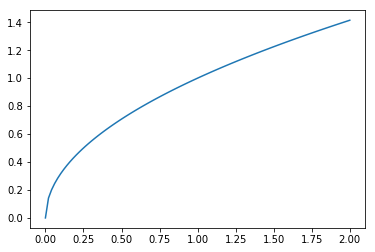

In [12]:
def plot_xy(exponent):
    x = np.linspace(0, 2, 100)
    y = x**exponent
    plt.plot(x, y)
    plt.show()
plot_xy(0.5)

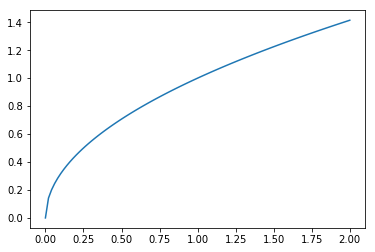

In [13]:
from IPython.display import clear_output

slider = widgets.FloatSlider(min=0.5, max=2, step=0.1, description="exponent")
def on_exponent_change(changes):
    clear_output(wait=True)
    plot_xy(slider.value)
slider.observe(on_exponent_change, "value")
plot_xy(slider.value)
slider

In [14]:
slider.max = 10

In [15]:
max_slider = widgets.FloatSlider(min=2, max=10, step=0.1)
widgets.jslink((max_slider, 'value'), (slider, 'max'))
max_slider

In [16]:
@widgets.interact(exponent=(0.5, 2, 0.1), n=(0.1, 2, 0.1))
def plotxy(exponent=0.5, n=0.1):
    x = np.linspace(0, 2, 100)
    y = (x+n)**exponent
    plt.plot(x, y)
    plt.show()

In [17]:
output = widgets.Output()
output

In [18]:
with output:
    print("hi")

In [19]:
with output:
    print("hello")

# Bqplot
 * [Documentation](https://bqplot.readthedocs.io)
 * [Github](https://github.com/bloomberg/bqplot)

In [20]:
import bqplot.pyplot as plt

In [21]:
x = np.linspace(0, 2, 50)
y = x**2
fig = plt.figure()
s = plt.scatter(x, y)
plt.show()

In [22]:
s.y = x**2

In [23]:
fig.animation_duration = 500

In [24]:
brush = plt.brush_selector()
fig.interaction = brush

In [25]:
s.selected_style = {'stroke':'red', 'fill': 'orange'}

In [26]:
s.selected = [1,10,30]

# Ipyleaflet
 * [Github](https://github.com/ellisonbg/ipyleaflet)

In [27]:
import ipyleaflet

In [28]:
m = ipyleaflet.Map(center = [34.6252978589571, -77.34580993652344], zoom = 10)

In [29]:
m

In [30]:
im = ipyleaflet.ImageOverlay(url='http://localhost:8888/static/base/images/logo.png', bounds=m.bounds, opacity=0.8)
m.add_layer(im)

In [31]:
pg = ipyleaflet.Polygon(locations=m.bounds_polygon, weight=3,
            color='#F00', opacity=0.8, fill_opacity=0.8,
            fill_color='#0F0')
m += pg

In [32]:
pg.fill_opacity = 0.1

In [33]:
from pythreejs import *

ModuleNotFoundError: No module named 'pythreejs'

In [ ]:
ball = Mesh(geometry=SphereGeometry(radius=1), 
                                    material=LambertMaterial(color='red'),
                                    position=[2, 1, 0])

scene = Scene(children=[ball, AmbientLight(color='#777777')])

c = PerspectiveCamera(position=[0, 5, 5], up=[0, 0, 1],
                      children=[DirectionalLight(color='white', 
                                                 position=[3, 5, 1], 
                                                 intensity=0.5)])
renderer = Renderer(camera=c, 
                    scene=scene, 
                    controls=[OrbitControls(controlling=c)])
renderer

In [ ]:
f = """
function f(origu,origv) {
    // scale u and v to the ranges I want: [0, 2*pi]
    var u = 2*Math.PI*origu;
    var v = 2*Math.PI*origv;
    
    var x = Math.sin(u);
    var y = Math.cos(v);
    var z = Math.cos(u+v);
    
    return new THREE.Vector3(x,y,z)
}
"""
surf_g = ParametricGeometry(func=f);

surf = Mesh(geometry=surf_g, material=LambertMaterial(color='green', side='FrontSide'))
surf2 = Mesh(geometry=surf_g, material=LambertMaterial(color='yellow', side='BackSide'))
scene = Scene(children=[surf, surf2, AmbientLight(color='#777777')])
c = PerspectiveCamera(position=[5, 5, 3], up=[0, 0, 1],
                      children=[DirectionalLight(color='white',
                                                 position=[3, 5, 1],
                                                 intensity=0.6)])
f = FlyControls(controlling=c)
renderer = Renderer(camera=c, scene=scene, controls=[f])
#renderer = Renderer(camera=c, scene=scene, controls=[OrbitControls(controlling=c)])
c.look_at(c.position, (1,0,0))
renderer

In [ ]:
surf.material.color = "red"

In [ ]:
gamepad = widgets.Controller()

In [ ]:
gamepad

In [ ]:
gamepad.axes[0].value

In [ ]:
widgets.jslink((gamepad.axes[1], 'value'), (f, 'pitch'))

In [ ]:
widgets.jslink((gamepad.axes[0], 'value'), (f, 'roll'))

In [ ]:
widgets.jslink((gamepad.axes[2], 'value'), (f, 'yaw'))

In [ ]:
widgets.jslink((gamepad.axes[3], 'value'), (f, 'forward_speed'))

In [ ]:
f.pitch = 10

# ipyvolume
 * [Documentation](https://ipyvolume.readthedocs.io) (live)
 * [Github](https://github.com/maartenbreddels/ipyvolume)

In [34]:
import ipyvolume.pylab as p3d

In [35]:
x = np.linspace(-1, 1, 20)
y = np.linspace(-1, 1, 20)
x, y = np.meshgrid(x, y)
x = x.flatten()
y = y.flatten()
z = np.sin(x) * np.cos(y)
fig = p3d.figure()
scatter = p3d.scatter(x, y, z, marker="sphere")
p3d.show()

In [36]:
fig.animation = 1800
fig.animation_exponent = 1

In [37]:
scatter.size =1

In [38]:
widgets.FloatSlider(min=0, max=10)

In [39]:
widgets.jslink((scatter, 'size'), (_, 'value'))

In [40]:
scatter.color = "blue"

In [41]:
scatter.color = "orange"

In [42]:
widgets.ColorPicker()

In [43]:
widgets.jslink((scatter, 'color'), (_, 'value'))

In [44]:
import ipyvolume

In [45]:
aq = ipyvolume.datasets.aquariusA2.fetch()

In [46]:
aq.data.shape

(120, 120, 120)

In [47]:
p3d.volshow(aq.data);

/Users/maartenbreddels/anaconda3/envs/bse/lib/python3.6/site-packages/ipyvolume/serialize.py:29: RuntimeWarning: invalid value encountered in true_divide
  gradient = gradient / np.sqrt(gradient[0]**2 + gradient[1]**2 + gradient[2]**2)


# Putting this all together - vaex

In [48]:
output = widgets.Output()
output

In [49]:
import vaex
import vaex.notebook
ds = vaex.datasets.helmi_de_zeeuw.fetch()

In [50]:
ds.select("x < 0")

In [51]:
with output:
    print(ds.mean("x", selection=True), ds.std("x", selection=True))

In [52]:
@vaex.notebook.interactive_selection(ds)
def stats():
    print(ds.mean("x", selection=True), ds.std("x", selection=True))

In [53]:
ds.select("y < 0")

In [54]:
@vaex.notebook.interactive_selection(ds)
@widgets.interact(x=ds.get_column_names(), y=ds.get_column_names(), f=["log", "identity", "sqrt"])
def plotxy(x="x", y="y", f="log"):
    ds.plot(x, y, f=f, show=True, selection=[False, True])

In [55]:
ds.select("x < 0")

In [56]:
p2d = ds.plot_widget("Lz", "E", f="log", backend="bqplot")

In [57]:
import ipywidgets as widgets

In [58]:
p2d.x = "x"

In [59]:
selectx = widgets.Select(options=ds.get_column_names(), value=p2d.x)
selectx

In [60]:
import traitlets

In [61]:
traitlets.link((p2d, 'x'), (selectx, 'value'))
#widgets.jslink((p2d, 'x'), (selectx, 'value'))


In [62]:
selecty = widgets.Select(options=ds.get_column_names(), value=p2d.y)
widgets.jslink((p2d, 'y'), (selecty, 'value'))
selecty

In [63]:
p3d = ds.plot_widget("x", "y", "z", vx="vx", vy="vy", vz="vz", smooth_pre=0.5,
               f="log1p", shape=100,
               vcount_limits=[30, None], backend="ipyvolume")

In [68]:
dstaxi = vaex.open("/Users/maartenbreddels/vaex/data/nytaxi/nyc_taxi2015.hdf5")
print("{:,}".format(len(dstaxi)))

146,112,989


In [69]:
dstaxi.plot_widget(dstaxi.col.pickup_longitude, dstaxi.col.pickup_latitude, f="log", show=True,
                   backend="ipyleaflet", selection=True)

In [70]:
dstaxi.plot_widget(dstaxi.col.dropoff_longitude, dstaxi.col.dropoff_latitude, f="log", show=True, backend="bqplot")

In [67]:
dstaxi.select('trip_distance < 5')

In [ ]:
dstaxi.select_nothing()

In [71]:
# dstaxi = vaex.open("/Users/maartenbreddels/vaex/data/nytaxi/nyc_taxi2015.hdf5")

In [72]:
pickups = dstaxi.plot_widget(dstaxi.col.pickup_longitude, dstaxi.col.pickup_latitude,
                   f="log", backend="bqplot", z=dstaxi.col.pickup_hour,
                   type="slice", z_shape=24, limits=[None, None, [-0.5, 23.5]],
                   z_relative=True, show=False)

In [73]:
import ipywidgets as widgets

In [77]:
# play= widgets.Play(min=0, max=24, step=1, delay=500)
# play

In [78]:
#traitlets.link((p2d.z_slice_slider, 'value'), (play, 'value'))

In [79]:
dropoffs = dstaxi.plot_widget(dstaxi.col.dropoff_longitude, dstaxi.col.dropoff_latitude,
                   f="log", backend="bqplot", z=dstaxi.col.dropoff_hour,
                   type="slice", z_shape=24, limits=[None, None, [-0.5, 23.5]],
                   z_relative=True, show=False)

In [80]:
widgets.HBox([pickups.widget, dropoffs.widget])

In [81]:
play= widgets.Play(min=0, max=24, step=1, interval=700)
traitlets.link((pickups.z_slice_slider, 'value'), (play, 'value'))
traitlets.link((dropoffs.z_slice_slider, 'value'), (play, 'value'))
play


In [82]:
traitlets.link((pickups.backend, 'limits'), (dropoffs.backend ,'limits'))
